In [181]:
# Hvor meget strøm er der blevet brugt af alle nodes
# Hvor meget strøm der er genereret af PV
# Hvor strøm der er hentet fra grid


# Kommer batterier nogensinde til 100% - Svar: JA
# Exporter vi nogensinde strøm til grid - Svar: NEJ

In [182]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, FuncFormatter
import seaborn as sns
import os
import re
from collections import defaultdict


#PATH_PLUGIN = '../results/plugin/25may-5xspeed-withplugin/logs/'
PATH_PLUGIN = '../results/plugin/2jun-30xspeed-withplugin-020pods/logs/'
#PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/26may-5xspeed-withoutplugin/logs/'
PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/4jun-30xspeed-withoutplugin-020pods/logs/'

battery_cols = ['battery', 'battery.1', 'battery.2', 'battery.3', 'battery.4']
node_cols = ['node', 'node.1', 'node.2', 'node.3', 'node.4', 'node.5', 'node.6', 'node.7', 'node.8', 'node.9', 'node.10', 'node.11', 'node.12', 'node.13', 'node.14', 'node.15', 'node.16', 'node.17']
pv_cols = ['pv_source', 'pv_source.1', 'pv_source.2', 'pv_source.3']
grid_cols = ['grid', 'grid.1', 'grid.2', 'grid.3', 'grid.4', 'grid.5', 'grid.6', 'grid.7']
balancing_cols = ['balancing', 'balancing.1', 'balancing.2']
balance_cols = ['balance', 'balance.1', 'balance.2', 'balance.3', 'balance.4', 'balance.5', 'balance.6', 'balance.7', 'balance.8', 'balance.9']


## Generate a dict for each microgrid

In [183]:
gridnames = pd.read_csv('../data/gridnames.csv')
names = gridnames['Gridname'].to_list()

test_df = pd.read_csv('../logs/XK00.csv')

NUM_ROWS = 2276
key_to_skip = "DE02"

dataframes_plugin = {}
dataframes_default_scheduler = {}

# Load Plugin DataFrames and truncate, skipping DE02
for name in names:
    if name == key_to_skip:
        print(f"Skipping {name} in Plugin data loading.")
        continue

    file_path = os.path.join(PATH_PLUGIN, f"{name}.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        dataframes_plugin[name] = df.iloc[:NUM_ROWS]
    else:
        print(f"Warning: File {file_path} does not exist.")

# Load Scheduler DataFrames, skipping DE02
for name in names:
    if name == key_to_skip:
        print(f"Skipping {name} in Scheduler data loading.")
        continue

    file_path = os.path.join(PATH_DEFAULT_SCHEDULER, f"{name}.csv")
    if os.path.exists(file_path):
        dataframes_default_scheduler[name] = pd.read_csv(file_path)
    else:
        print(f"Warning: File {file_path} does not exist.")


Skipping DE02 in Plugin data loading.
Skipping DE02 in Scheduler data loading.


In [184]:
plugin_row_counts = {name: len(df) for name, df in dataframes_plugin.items()}
scheduler_row_counts = {name: len(df) for name, df in dataframes_default_scheduler.items()}

comparison_df = pd.DataFrame({
    'Name': names,
    'Plugin': [plugin_row_counts.get(name) for name in names],
    'Scheduler': [scheduler_row_counts.get(name) for name in names]
})

comparison_df['Equal'] = comparison_df['Plugin'] == comparison_df['Scheduler']

print(comparison_df)
not_equal_rows = comparison_df[~comparison_df['Equal']]
print("\nRows where Plugin and Scheduler do NOT have equal rows:")
print(not_equal_rows)

     Name  Plugin  Scheduler  Equal
0    AL00  2276.0     2276.0   True
1    AT01  2276.0     2276.0   True
2    AT02  2276.0     2276.0   True
3    AT03  2276.0     2276.0   True
4    BA00  2276.0     2276.0   True
..    ...     ...        ...    ...
147  UK03  2276.0     2276.0   True
148  UK04  2276.0     2276.0   True
149  UK05  2276.0     2276.0   True
150  UKNI  2276.0     2276.0   True
151  XK00  2276.0     2276.0   True

[152 rows x 4 columns]

Rows where Plugin and Scheduler do NOT have equal rows:
    Name  Plugin  Scheduler  Equal
15  DE02     NaN        NaN  False


## Battery Dataframes

In [185]:
battery_dataframes_plugin = {}
battery_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_scheduler[name] = df[existing_cols]


### Rename headers

In [186]:
for key, df in battery_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_plugin[key] = df

for key, df in battery_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_scheduler[key] = df


battery_dataframes_plugin['AL00']


1,charge_amount,current_charge,discharge_amount,reward,soc
0,0.0,11648.35,720.0,-0.0,0.500000
1,0.0,10928.35,720.0,-0.0,0.469094
2,0.0,10208.35,720.0,-0.0,0.438189
3,0.0,9488.35,720.0,-0.0,0.407283
4,0.0,8768.35,720.0,-0.0,0.376377
...,...,...,...,...,...
2269,0.0,0.00,0.0,-0.0,0.000000
2270,0.0,0.00,0.0,-0.0,0.000000
2271,0.0,0.00,0.0,-0.0,0.000000
2272,0.0,0.00,0.0,-0.0,0.000000


### Plot figures (SOC)

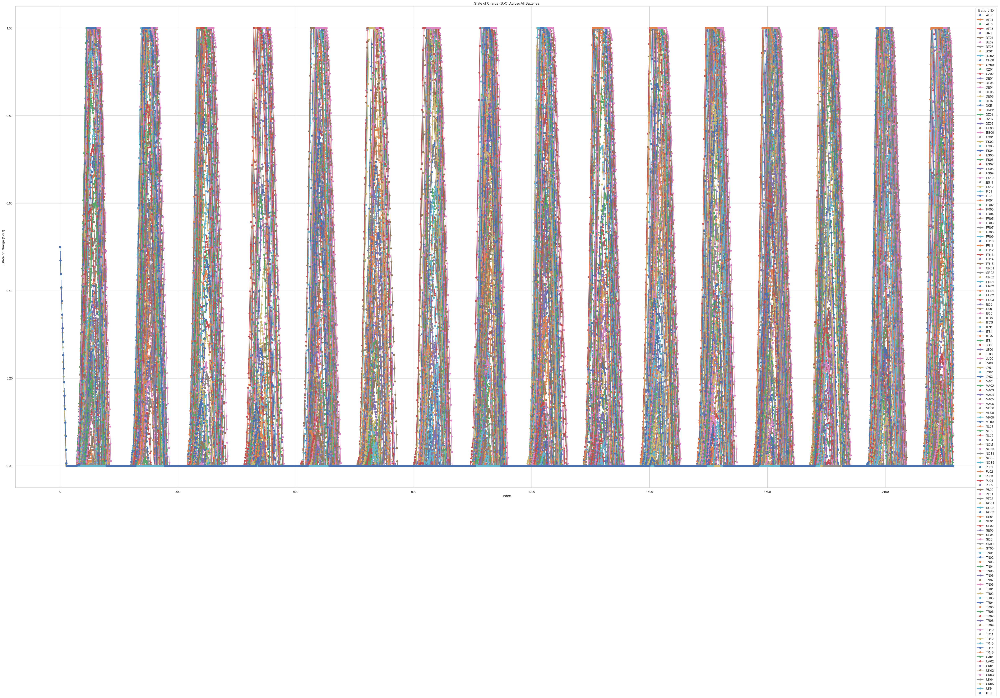

In [187]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in battery_dataframes_plugin.items():
    if 'soc' not in df.columns:
        print(f"Skipping {key}: no 'soc' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['soc'] = pd.to_numeric(df['soc'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['soc'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("State of Charge (SoC) Across All Batteries")
plt.xlabel("Index")
plt.ylabel("State of Charge (SoC)")
plt.grid(True)
plt.legend(title="Battery ID")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Grid Dataframes

In [188]:
grid_dataframes_plugin = {}
grid_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_scheduler[name] = df[existing_cols]

### Rename headers

In [189]:
for key, df in grid_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_plugin[key] = df

for key, df in grid_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_scheduler[key] = df


grid_dataframes_plugin['AL00']

1,co2_per_kwh_current,co2_production,export_price_current,grid_export,grid_import,grid_status_current,import_price_current,reward
0,999.0,0.0,0.000876,0.0,0.0,1.0,0.000973,-0.000000
1,999.0,0.0,0.000876,0.0,0.0,1.0,0.000973,-0.000000
2,999.0,0.0,0.000876,0.0,0.0,1.0,0.000973,-0.000000
3,999.0,0.0,0.000876,0.0,0.0,1.0,0.000973,-0.000000
4,999.0,0.0,0.000876,0.0,0.0,1.0,0.000973,-0.000000
...,...,...,...,...,...,...,...,...
2269,999.0,713286.0,0.000876,0.0,714.0,1.0,0.000973,-0.694725
2270,999.0,713286.0,0.000876,0.0,714.0,1.0,0.000973,-0.694725
2271,999.0,713286.0,0.000876,0.0,714.0,1.0,0.000973,-0.694725
2272,999.0,713286.0,0.000876,0.0,714.0,1.0,0.000973,-0.694725


### Plugin

#### Plot Plugin figures (Export, Import, CO2 Production)

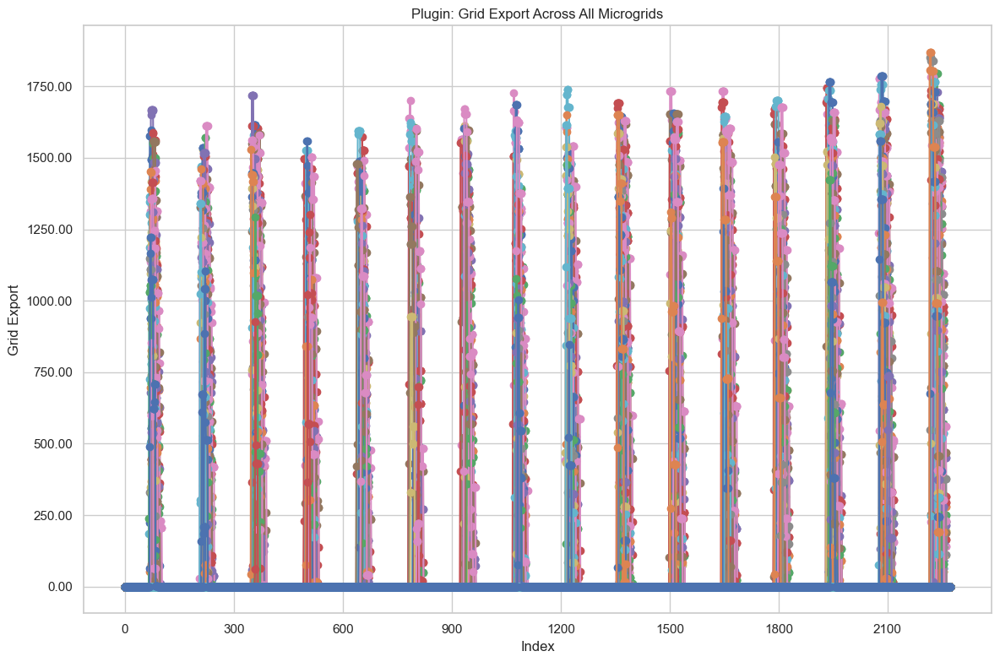

In [190]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Plugin: Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

In [191]:
total_exports = {}

for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Ensure the column is numeric
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Calculate total export and store it
    total_export = df['grid_export'].sum(skipna=True)
    total_exports[key] = total_export

# Print total exports
print("\nPlugin: Total Grid Export per Microgrid:")
for key, total in total_exports.items():
    print(f"{key}: {total:.2f}")


Plugin: Total Grid Export per Microgrid:
AL00: 9277.17
AT01: 14307.68
AT02: 7220.67
AT03: 7838.41
BA00: 9115.54
BE01: 0.00
BE02: 0.00
BE03: 0.00
BG01: 59037.64
BG02: 75134.56
CH00: 0.00
CY00: 58500.85
CZ01: 0.00
CZ02: 0.00
DE01: 0.00
DE03: 0.00
DE04: 0.00
DE05: 0.00
DE06: 0.00
DE07: 5824.83
DKE1: 0.00
DKW1: 0.00
DZ01: 320253.57
DZ02: 351623.00
DZ03: 350819.33
EE00: 0.00
EG00: 419410.36
ES01: 18343.66
ES02: 35108.00
ES03: 12593.47
ES04: 40649.49
ES05: 76881.64
ES06: 66837.13
ES07: 48710.99
ES08: 43734.52
ES09: 55632.77
ES10: 80001.33
ES11: 37205.66
ES12: 409.12
FI01: 0.00
FI02: 0.00
FR01: 6911.49
FR02: 5499.94
FR03: 62075.78
FR04: 15583.74
FR05: 0.00
FR06: 22277.91
FR07: 0.00
FR08: 1372.40
FR09: 0.00
FR10: 0.00
FR11: 0.00
FR12: 0.00
FR13: 0.00
FR14: 0.00
FR15: 0.00
GR01: 60852.25
GR02: 20442.88
GR03: 20891.94
HR01: 0.00
HR02: 2425.30
HU01: 14029.90
HU02: 12721.65
HU03: 5937.79
IE00: 0.00
IL00: 250679.15
IS00: 0.00
ITCN: 7151.07
ITCS: 2881.86
ITN1: 53124.52
ITS1: 18157.48
ITSA: 30515.35

In [192]:
# Calculate total export across all microgrids
total_export_all = sum(total_exports.values())

print(f"\nPlugin: Total Grid Export Across ALL Microgrids: {total_export_all:.2f}")


Plugin: Total Grid Export Across ALL Microgrids: 9886073.38


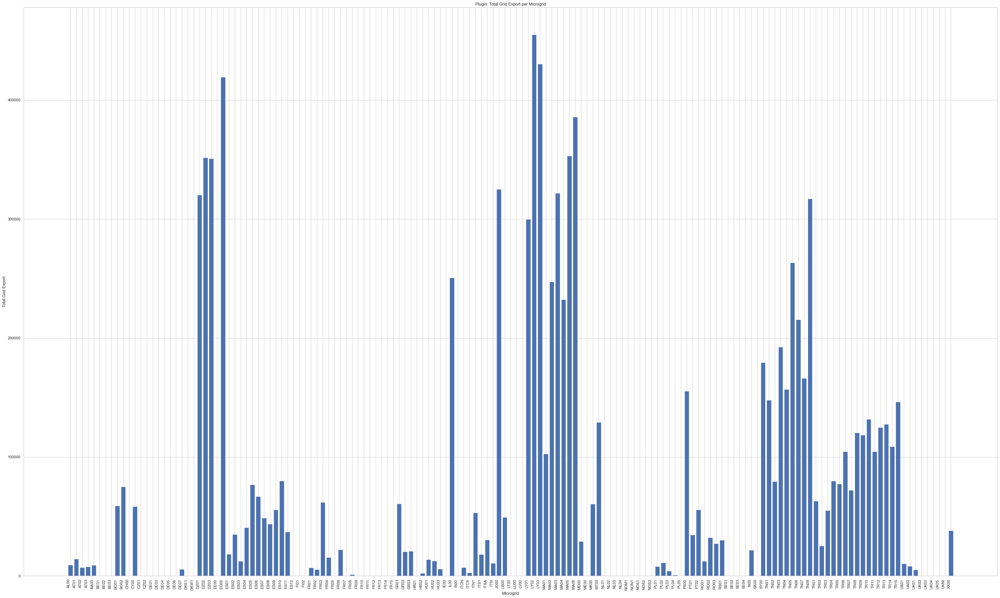

In [193]:
plt.figure(figsize=(40, 24))
plt.bar(total_exports.keys(), total_exports.values())
plt.title("Plugin: Total Grid Export per Microgrid")
plt.xlabel("Microgrid")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align them
plt.xticks(rotation=90, ha='right')  # or rotation=90 if needed

plt.tight_layout()
plt.show()


Plugin: Total Grid Export by Country Code:
MA: 1643089.88
TN: 1539050.02
TR: 1460579.14
LY: 1185135.88
DZ: 1022695.90
ES: 516107.77
EG: 419410.36
JO: 325109.57
IL: 250679.15
SY: 179398.84
PS: 155466.07
BG: 134172.20
MT: 129218.45
IT: 122549.19
FR: 113721.26
GR: 102187.08
PT: 90305.72
RO: 71965.10
MK: 60593.61
CY: 58500.85
LB: 49485.32
XK: 38289.89
HU: 32689.34
RS: 30129.09
AT: 29366.77
MD: 29089.56
PL: 24567.61
SI: 21825.30
UA: 18803.46
AL: 9277.17
BA: 9115.54
DE: 5824.83
UK: 5248.15
HR: 2425.30
BE: 0.00
CH: 0.00
CZ: 0.00
DK: 0.00
EE: 0.00
FI: 0.00
IE: 0.00
IS: 0.00
LT: 0.00
LU: 0.00
LV: 0.00
ME: 0.00
NL: 0.00
NO: 0.00
SE: 0.00
SK: 0.00


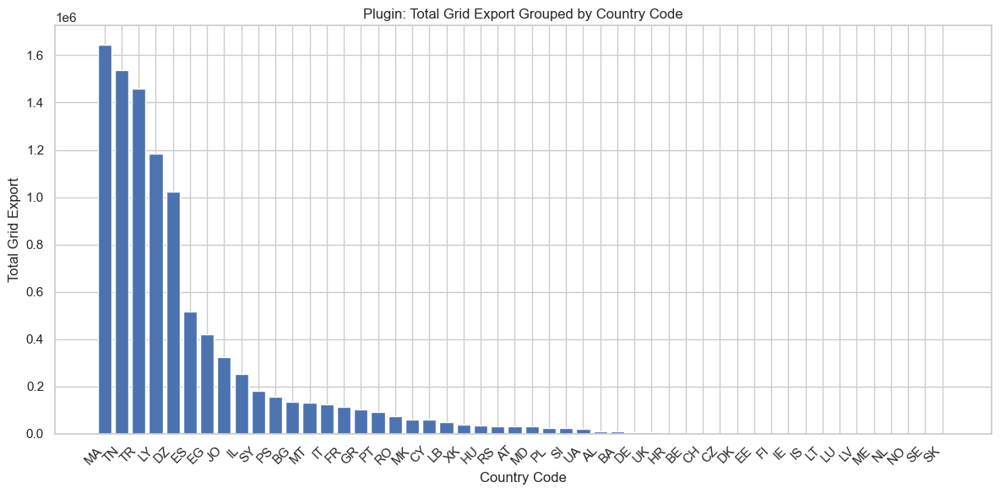

In [194]:

# --- Step 1: Total exports per grid ---
total_exports = {}

for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        continue

    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')
    total_exports[key] = df['grid_export'].sum(skipna=True)

# --- Step 2: Extract 2-letter country code prefix (e.g., AL, ES) ---
def extract_code(key):
    match = re.match(r'^([A-Za-z]{2})', key)  # now accepts lowercase too
    return match.group(1).upper() if match else 'Unknown'

# --- Step 3: Group by extracted country code ---
code_grouped_exports = defaultdict(float)
for key, total in total_exports.items():
    code = extract_code(key)
    code_grouped_exports[code] += total

# --- Step 4: Sort and print grouped totals ---
sorted_codes = dict(sorted(code_grouped_exports.items(), key=lambda item: item[1], reverse=True))

print("\nPlugin: Total Grid Export by Country Code:")
for code, total in sorted_codes.items():
    print(f"{code}: {total:.2f}")

plt.figure(figsize=(12, 6))  # Wider plot for more spacing
plt.bar(sorted_codes.keys(), sorted_codes.values())
plt.title("Plugin: Total Grid Export Grouped by Country Code")
plt.xlabel("Country Code")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

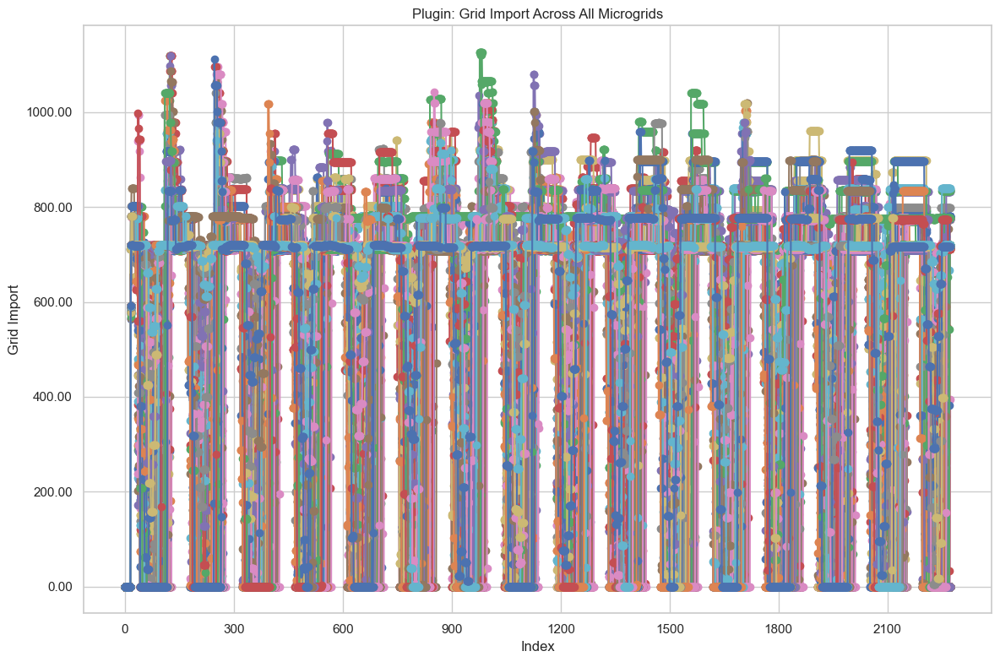

In [195]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_import' not in df.columns:
        print(f"Skipping {key}: no 'grid_import' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_import'] = pd.to_numeric(df['grid_import'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_import'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Plugin: Grid Import Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Import")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

### Scheduler

#### Plot Scheduler figures (Export, Import, CO2 Production)

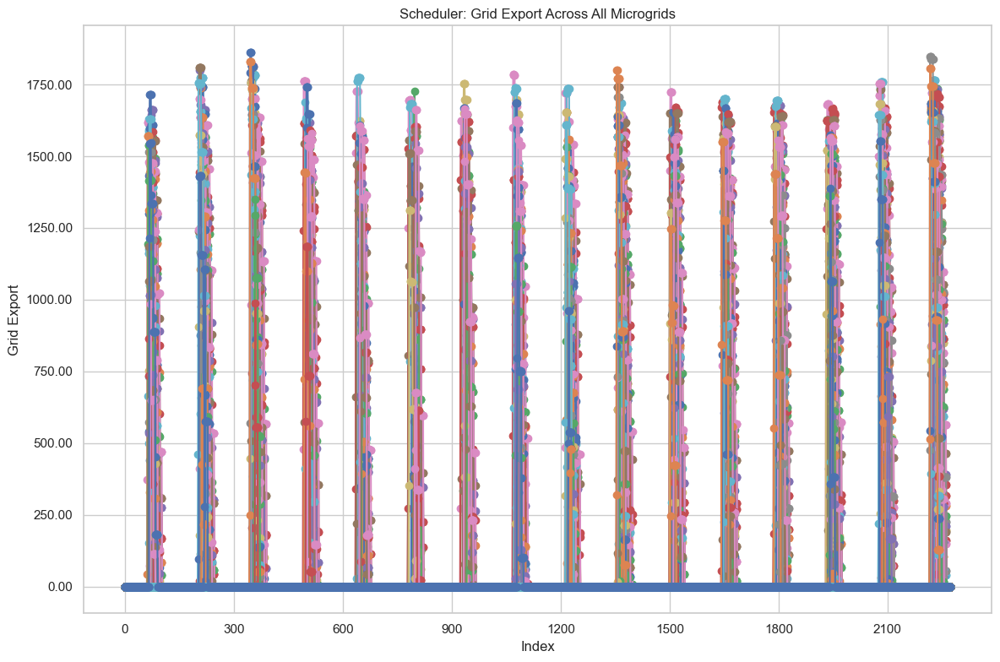

In [196]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Scheduler: Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

In [197]:
total_exports = {}

for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Ensure the column is numeric
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Calculate total export and store it
    total_export = df['grid_export'].sum(skipna=True)
    total_exports[key] = total_export

# Print total exports
print("\nScheduler: Total Grid Export per Microgrid:")
for key, total in total_exports.items():
    print(f"{key}: {total:.2f}")


Scheduler: Total Grid Export per Microgrid:
AL00: 10055.17
AT01: 16657.68
AT02: 8315.69
AT03: 9680.86
BA00: 12289.59
BE01: 0.00
BE02: 555.16
BE03: 803.68
BG01: 89061.66
BG02: 106948.61
CH00: 0.00
CY00: 82787.64
CZ01: 0.00
CZ02: 0.00
DE01: 0.00
DE03: 0.00
DE04: 0.00
DE05: 0.00
DE06: 0.00
DE07: 1640.83
DKE1: 0.00
DKW1: 0.00
DZ01: 359455.57
DZ02: 373619.21
DZ03: 418400.33
EE00: 0.00
EG00: 492549.24
ES01: 18343.66
ES02: 33950.00
ES03: 15389.92
ES04: 36042.80
ES05: 89419.17
ES06: 91883.34
ES07: 54379.55
ES08: 45441.18
ES09: 58725.39
ES10: 77725.71
ES11: 39260.66
ES12: 15393.88
FI01: 0.00
FI02: 0.00
FR01: 9225.49
FR02: 277.92
FR03: 69087.92
FR04: 15503.74
FR05: 0.00
FR06: 21889.91
FR07: 0.00
FR08: 0.00
FR09: 0.00
FR10: 0.00
FR11: 0.00
FR12: 0.00
FR13: 0.00
FR14: 0.00
FR15: 0.00
GR01: 75712.87
GR02: 31175.68
GR03: 21419.02
HR01: 0.00
HR02: 2631.30
HU01: 15601.39
HU02: 15067.91
HU03: 6165.79
IE00: 1687.72
IL00: 281509.78
IS00: 0.00
ITCN: 2731.07
ITCS: 2974.39
ITN1: 60310.42
ITS1: 13703.49
ITS

In [198]:
# Calculate total export across all microgrids
total_export_all = sum(total_exports.values())

print(f"\nScheduler: Total Grid Export Across ALL Microgrids: {total_export_all:.2f}")


Scheduler: Total Grid Export Across ALL Microgrids: 11589370.78


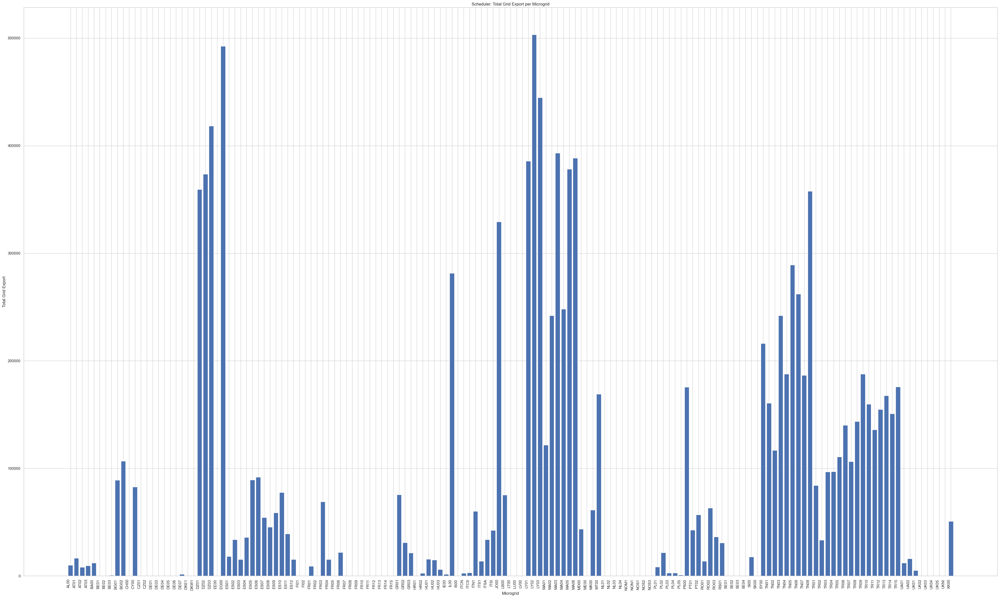

In [199]:
plt.figure(figsize=(40, 24))
plt.bar(total_exports.keys(), total_exports.values())
plt.title("Scheduler: Total Grid Export per Microgrid")
plt.xlabel("Microgrid")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align them
plt.xticks(rotation=90, ha='right')  # or rotation=90 if needed

plt.tight_layout()
plt.show()


Scheduler: Total Grid Export by Country Code:
TR: 1945685.05
TN: 1802877.64
MA: 1771833.59
LY: 1333505.81
DZ: 1151475.11
ES: 575955.27
EG: 492549.24
JO: 329250.59
IL: 281509.78
SY: 216081.26
BG: 196010.27
PS: 175596.77
MT: 169149.60
IT: 156102.64
GR: 128307.57
FR: 115984.97
RO: 113405.40
PT: 99660.72
CY: 82787.64
LB: 75320.04
MK: 61416.19
XK: 50928.92
MD: 43598.44
PL: 36862.68
HU: 36835.10
AT: 34654.23
RS: 30781.13
UA: 28502.54
SI: 17828.98
BA: 12289.59
AL: 10055.17
UK: 5250.15
HR: 2631.30
IE: 1687.72
DE: 1640.83
BE: 1358.84
CH: 0.00
CZ: 0.00
DK: 0.00
EE: 0.00
FI: 0.00
IS: 0.00
LT: 0.00
LU: 0.00
LV: 0.00
ME: 0.00
NL: 0.00
NO: 0.00
SE: 0.00
SK: 0.00


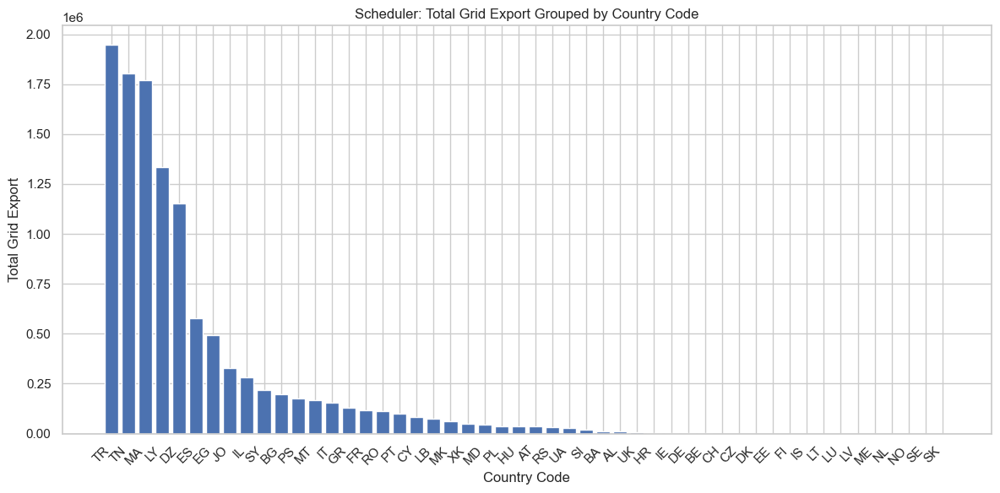

In [200]:

# --- Step 1: Total exports per grid ---
total_exports = {}

for key, df in grid_dataframes_scheduler.items():
    if 'grid_export' not in df.columns:
        continue

    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')
    total_exports[key] = df['grid_export'].sum(skipna=True)

# --- Step 2: Extract 2-letter country code prefix (e.g., AL, ES) ---
def extract_code(key):
    match = re.match(r'^([A-Za-z]{2})', key)  # now accepts lowercase too
    return match.group(1).upper() if match else 'Unknown'

# --- Step 3: Group by extracted country code ---
code_grouped_exports = defaultdict(float)
for key, total in total_exports.items():
    code = extract_code(key)
    code_grouped_exports[code] += total

# --- Step 4: Sort and print grouped totals ---
sorted_codes = dict(sorted(code_grouped_exports.items(), key=lambda item: item[1], reverse=True))

print("\nScheduler: Total Grid Export by Country Code:")
for code, total in sorted_codes.items():
    print(f"{code}: {total:.2f}")

plt.figure(figsize=(12, 6))  # Wider plot for more spacing
plt.bar(sorted_codes.keys(), sorted_codes.values())
plt.title("Scheduler: Total Grid Export Grouped by Country Code")
plt.xlabel("Country Code")
plt.ylabel("Total Grid Export")

# Rotate x-axis labels and align
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

## PV Dataframes

In [201]:
pv_dataframes_plugin = {}
pv_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_scheduler[name] = df[existing_cols]

In [202]:
for key, df in pv_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_plugin[key] = df

for key, df in pv_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_scheduler[key] = df


pv_dataframes_scheduler['AL00']

1,curtailment,renewable_current,renewable_used,reward
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
2269,0.0,0.0,0.0,0.0
2270,0.0,0.0,0.0,0.0
2271,0.0,0.0,0.0,0.0
2272,0.0,0.0,0.0,0.0


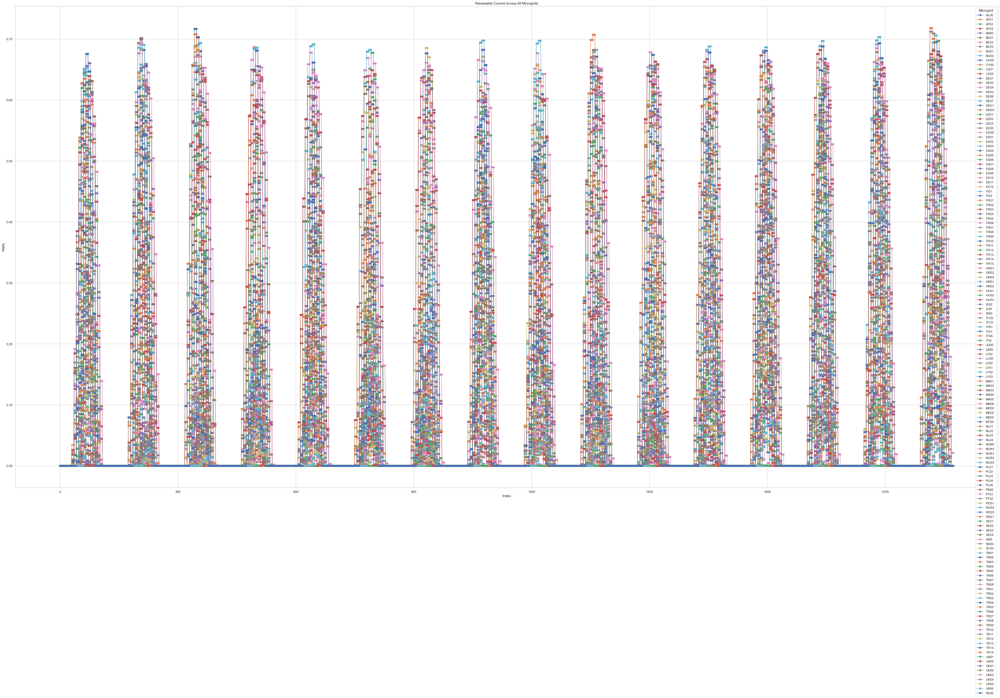

In [203]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in pv_dataframes_plugin.items():
    if 'renewable_current' not in df.columns:
        print(f"Skipping {key}: no 'renewable_current' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['renewable_current'] = pd.to_numeric(df['renewable_current'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['renewable_current'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Renewable Current Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Nodes Dataframes

In [204]:
nodes_dataframes_plugin = {}
nodes_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_scheduler[name] = df[existing_cols]

In [205]:
for key, df in nodes_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_plugin[key] = df

for key, df in nodes_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_scheduler[key] = df


nodes_dataframes_scheduler['TR10']

1,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward
0,120,-59.481963,0.0,120,-44.877580,0.0,120,-0.759295,0.0,120,-57.871521,0.0,120,-46.647117,0.0,120,-50.763622,0.0
1,120,-36.507199,0.0,120,-34.833665,0.0,120,-53.812142,0.0,120,-48.563753,0.0,120,-54.285852,0.0,120,-35.981958,0.0
2,120,-16.613206,0.0,120,-46.614458,0.0,120,-29.666297,0.0,120,-50.495262,0.0,120,-41.286534,0.0,120,-42.737372,0.0
3,120,-17.862433,0.0,120,-1.337987,0.0,120,-35.536769,0.0,120,-0.124600,0.0,120,-47.950001,0.0,120,-4.497583,0.0
4,120,-18.442951,0.0,120,-2.053270,0.0,120,-30.384277,0.0,120,-32.998274,0.0,120,-0.684689,0.0,120,-54.960032,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2269,118,-3.837405,0.0,118,-21.341833,0.0,120,-32.627855,0.0,118,-43.789349,0.0,118,-9.955478,0.0,118,-59.707468,0.0
2270,118,-23.937771,0.0,118,-55.576092,0.0,120,-28.603584,0.0,118,-48.037120,0.0,118,-49.337284,0.0,118,-51.582926,0.0
2271,118,-48.979592,0.0,118,-40.306807,0.0,120,-45.054403,0.0,118,-11.648076,0.0,118,-52.317294,0.0,118,-52.852532,0.0
2272,118,-15.280667,0.0,118,-46.389877,0.0,120,-49.224804,0.0,118,-40.803536,0.0,118,-7.908567,0.0,118,-22.450676,0.0


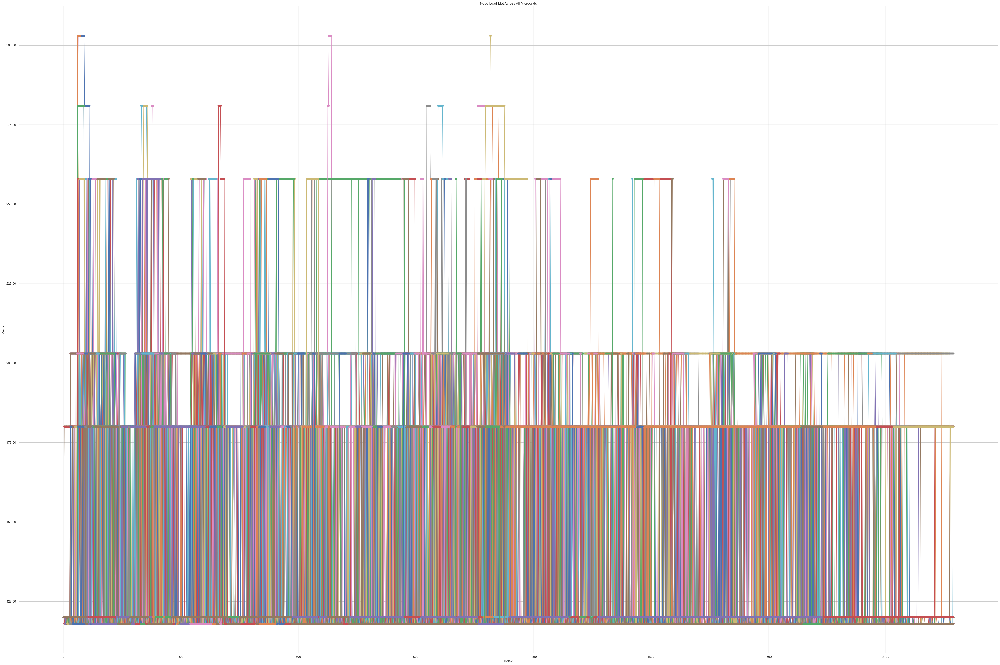

In [206]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame
for key, df in nodes_dataframes_plugin.items():
    # Find all column indices where the name is 'load_met'
    load_met_indices = [i for i, col in enumerate(df.columns) if col == 'load_met']
    
    if not load_met_indices:
        print(f"Skipping {key}: no 'load_met' columns found.")
        continue

    # Plot each 'load_met' column individually
    for idx_num, col_idx in enumerate(load_met_indices, 1):
        col_data = pd.to_numeric(df.iloc[:, col_idx], errors='coerce')
        label = f"{key} - load_met {idx_num}" if len(load_met_indices) > 1 else f"{key}"
        plt.plot(df.index, col_data, marker='o', linestyle='-', label=label)

# Customize plot
plt.title("Node Load Met Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Balancing Dataframes

In [207]:
balancing_dataframes_plugin = {}
balancing_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_scheduler[name] = df[existing_cols]

In [208]:
for key, df in balancing_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_plugin[key] = df

for key, df in balancing_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_scheduler[key] = df


balancing_dataframes_scheduler['TR10']

1,loss_load,overgeneration,reward
0,0.0,0.0,-0.0
1,0.0,0.0,-0.0
2,0.0,0.0,-0.0
3,0.0,0.0,-0.0
4,0.0,0.0,-0.0
...,...,...,...
2269,0.0,0.0,-0.0
2270,0.0,0.0,-0.0
2271,0.0,0.0,-0.0
2272,0.0,0.0,-0.0


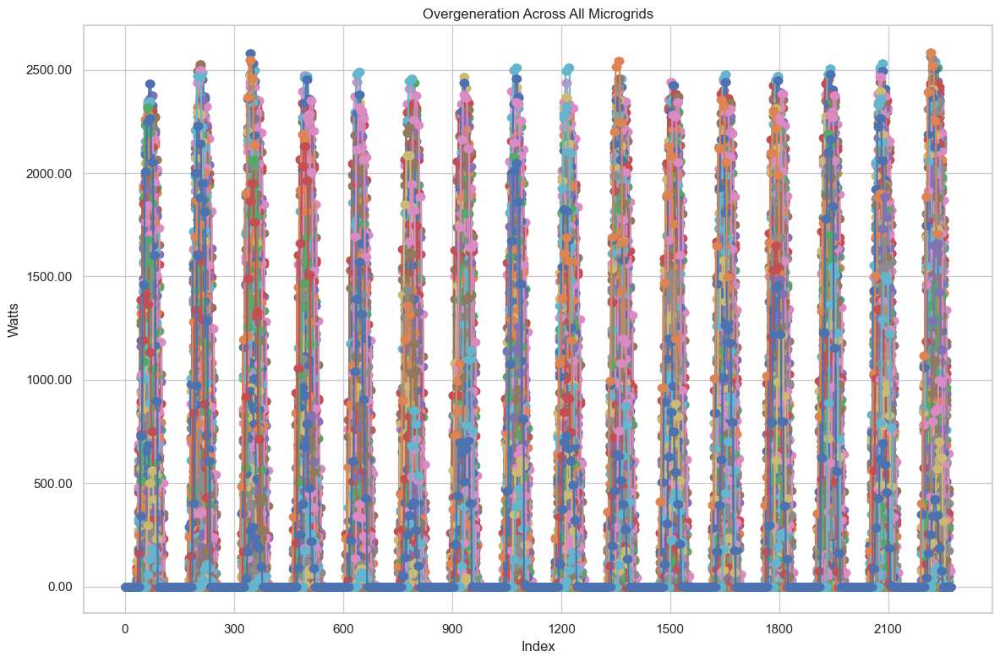

In [209]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in balancing_dataframes_plugin.items():
    if 'loss_load' not in df.columns:
        print(f"Skipping {key}: no 'loss_load' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['loss_load'] = pd.to_numeric(df['loss_load'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['loss_load'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Overgeneration Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Explore relation between PV Generation, Battery current_charge, grid import/export

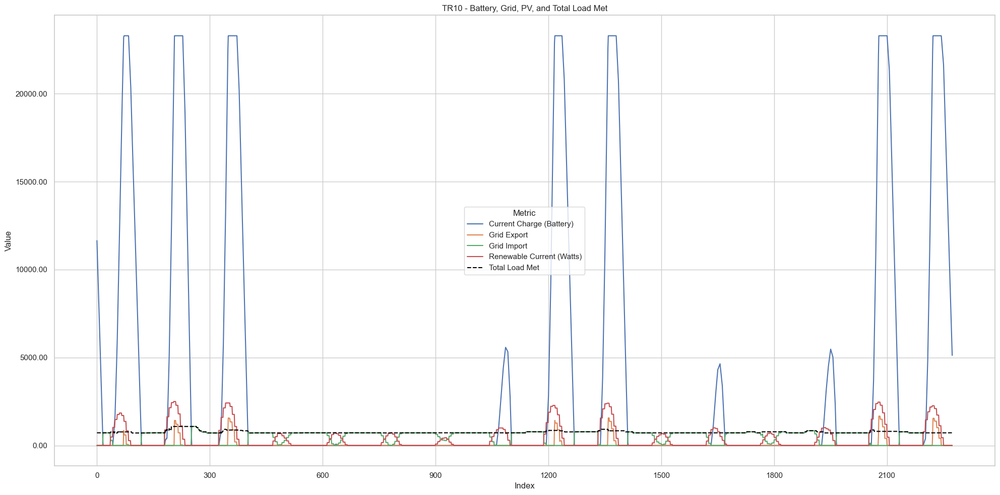

In [210]:
# Set Seaborn style
sns.set(style="whitegrid")

# Extract the relevant DataFrames
battery_df = battery_dataframes_plugin.get('TR10')
grid_df = grid_dataframes_plugin.get('TR10')
pv_df = pv_dataframes_plugin.get('TR10')
nodes_df = nodes_dataframes_plugin.get('TR10')

# Check that all exist
if battery_df is None or grid_df is None or pv_df is None or nodes_df is None:
    raise ValueError("One or more dataframes for 'TR10' are missing.")

# Convert necessary columns to numeric
battery_df['current_charge'] = pd.to_numeric(battery_df['current_charge'], errors='coerce')
grid_df['grid_export'] = pd.to_numeric(grid_df['grid_export'], errors='coerce')
grid_df['grid_import'] = pd.to_numeric(grid_df['grid_import'], errors='coerce')
pv_df['renewable_current'] = pd.to_numeric(pv_df['renewable_current'], errors='coerce')

# Scale renewable_current to watt-hours (assuming it's energy per second)
pv_df['renewable_current_watts'] = pv_df['renewable_current'] * 3600

# Sum all 'load_met' columns from nodes_df (handling duplicates)
load_met_indices = [i for i, col in enumerate(nodes_df.columns) if col == 'load_met']
if not load_met_indices:
    print("No 'load_met' columns found in nodes_df for TR10.")
    total_load_met = None
else:
    # Sum all matching columns across the rows
    load_met_df = nodes_df.iloc[:, load_met_indices].apply(pd.to_numeric, errors='coerce')
    total_load_met = load_met_df.sum(axis=1)

# Create the plot
plt.figure(figsize=(20, 10))

# Plot each series from its respective DataFrame
plt.plot(battery_df.index, battery_df['current_charge'], label='Current Charge (Battery)')
plt.plot(grid_df.index, grid_df['grid_export'], label='Grid Export')
plt.plot(grid_df.index, grid_df['grid_import'], label='Grid Import')
plt.plot(pv_df.index, pv_df['renewable_current_watts'], label='Renewable Current (Watts)')

# Plot summed load_met if available
if total_load_met is not None:
    plt.plot(nodes_df.index, total_load_met, label='Total Load Met', linestyle='--', color='black')

# Customize the plot
plt.title("TR10 - Battery, Grid, PV, and Total Load Met")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend(title="Metric")
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Checking if grid import/export is active

In [211]:
test_df.columns

battery_test = test_df[battery_cols]
grid_test = test_df[grid_cols]
pv_test = test_df[pv_cols]

battery_test = battery_test.drop([0, 1])
battery_test # battery.1 = current_charge

grid_test = grid_test.drop([0, 1])
grid_test # grid.3 export, grid.4 import

pv_test = pv_test.drop([0, 1])
pv_test # pv_source.1 renewable_current

battery_test = battery_test.apply(pd.to_numeric, errors='coerce')
grid_test = grid_test.apply(pd.to_numeric, errors='coerce')
pv_test = pv_test.apply(pd.to_numeric, errors='coerce')



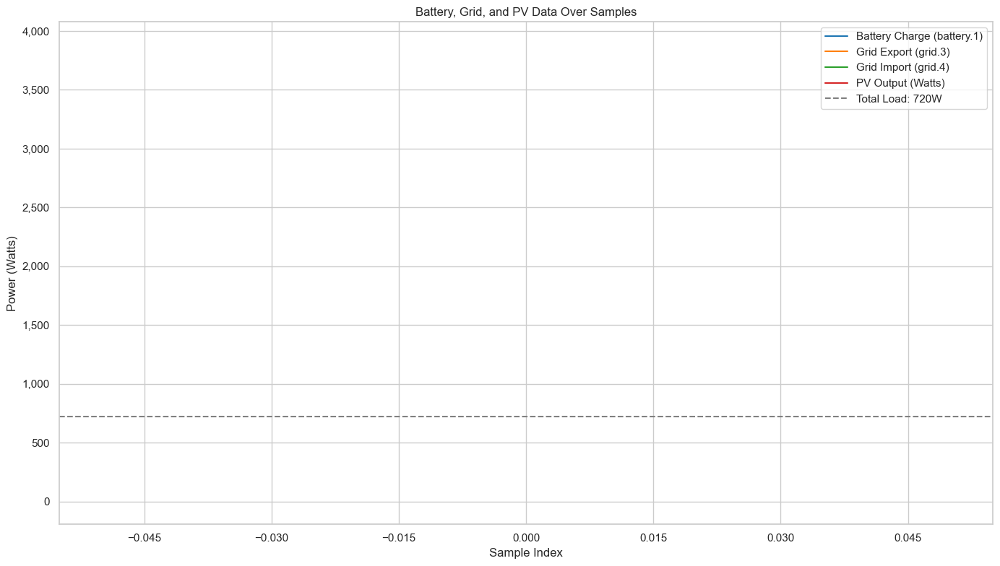

In [212]:
# Optional: set Seaborn style
sns.set(style="whitegrid")

# Adjust pv_source.1 to watts (assuming it's % of 3600 W capacity)
pv_watts = pv_test['pv_source.1'] * 3600

# Combine the relevant columns into one DataFrame
combined_df = pd.DataFrame({
    'Battery Charge (battery.1)': battery_test['battery.1'],
    'Grid Export (grid.3)': grid_test['grid.3'],
    'Grid Import (grid.4)': grid_test['grid.4'],
    'PV Output (Watts)': pv_watts
}).reset_index(drop=True)  # So x-axis is 0...N-1

# Create the plot
plt.figure(figsize=(14, 8))
palette = sns.color_palette("tab10")

for i, column in enumerate(combined_df.columns):
    plt.plot(combined_df.index, combined_df[column], label=column, color=palette[i])

# Add a horizontal dotted line at y = 720
plt.axhline(y=720, color='gray', linestyle='--', linewidth=1.5, label='Total Load: 720W')

# Add a vertical dotted line and annotation at x = 62
x_pos = 62
if x_pos < len(combined_df):
    y1 = combined_df.loc[x_pos, 'PV Output (Watts)']
    y2 = combined_df.loc[x_pos, 'Grid Export (grid.3)']
    
    # Vertical line
    plt.plot([x_pos, x_pos], [y1, y2], color='black', linestyle=':', linewidth=2, label='Δ at x=62')
    
    # Annotate difference
    diff = abs(y1 - y2)
    mid_y = (y1 + y2) / 2
    plt.text(x_pos + 1, mid_y, f'{diff:.0f} W', va='center', ha='left', fontsize=10,
             color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Format axes
plt.xlabel('Sample Index')
plt.ylabel('Power (Watts)')
plt.title('Battery, Grid, and PV Data Over Samples')
plt.legend()
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.tight_layout()
plt.show()

## Azure Worktrace

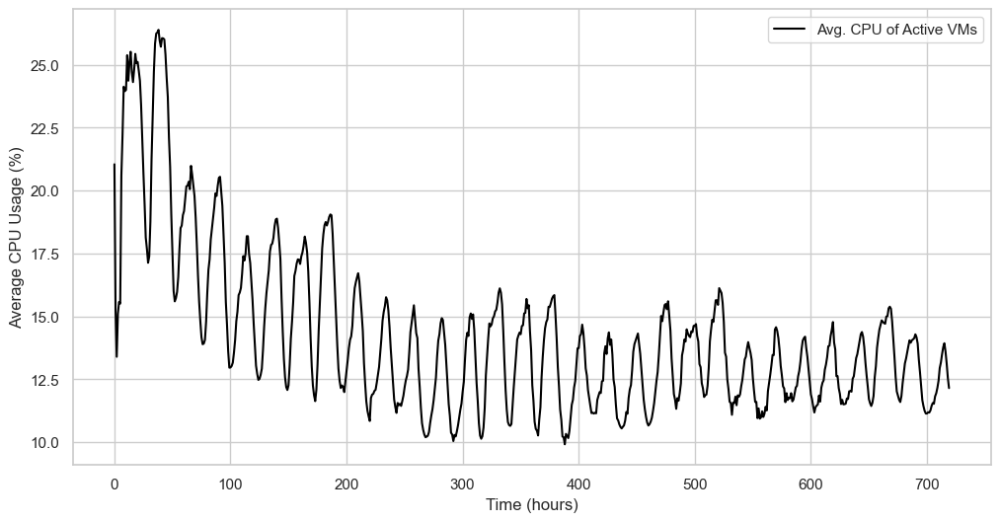

In [213]:
azure = pd.read_csv('../data/vmtable2.csv')
# Parse columns
azure.iloc[:, 0] = pd.to_numeric(azure.iloc[:, 0])  # vm_created (seconds)
azure.iloc[:, 1] = pd.to_numeric(azure.iloc[:, 1])  # vm_deleted (seconds)
azure.iloc[:, 3] = pd.to_numeric(azure.iloc[:, 3])  # avg_cpu

vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values
avg_cpu = azure.iloc[:, 3].values

# Set up a timeline grid (e.g. every hour)
time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

avg_cpu_over_time = []

# For each time point, calculate avg CPU of running VMs
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    running_cpus = avg_cpu[running_mask]
    
    if len(running_cpus) > 0:
        avg_cpu_over_time.append(running_cpus.mean())
    else:
        avg_cpu_over_time.append(np.nan)

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Plot
plt.figure(figsize=(12, 6))
plt.plot(time_hours, avg_cpu_over_time, label='Avg. CPU of Active VMs', color='black')
plt.xlabel('Time (hours)')
plt.ylabel('Average CPU Usage (%)')
plt.grid(True)
plt.legend()
plt.show()

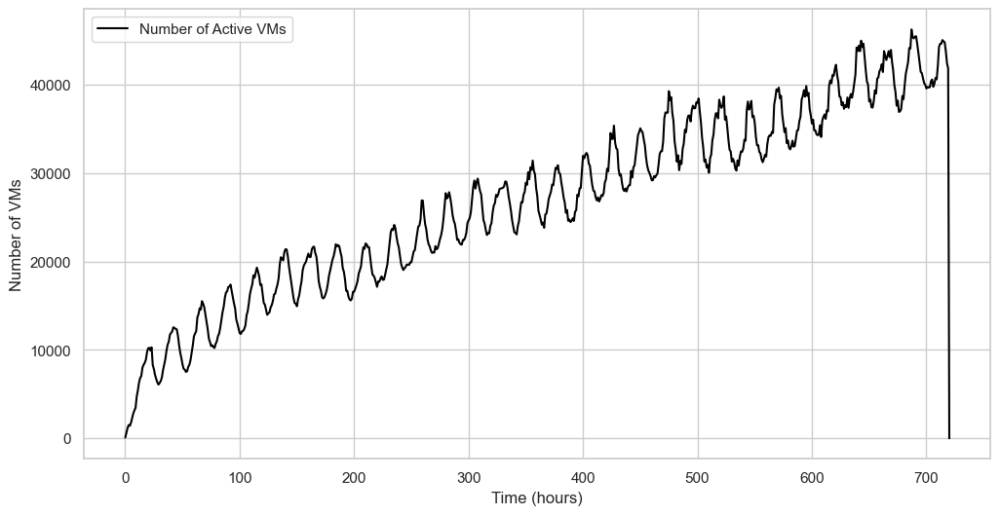

In [214]:
# Assuming azure dataframe is already loaded and columns parsed
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

active_vm_counts = []
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    active_vm_counts.append(np.sum(running_mask))

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Create a DataFrame for seaborn
plot_df = pd.DataFrame({
    'Time (hours)': time_hours,
    'Active VMs': active_vm_counts
})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(data=plot_df, x='Time (hours)', y='Active VMs', color='black', label='Number of Active VMs')
plt.xlabel('Time (hours)')
plt.ylabel('Number of VMs')
plt.grid(True)
plt.legend()
plt.show()

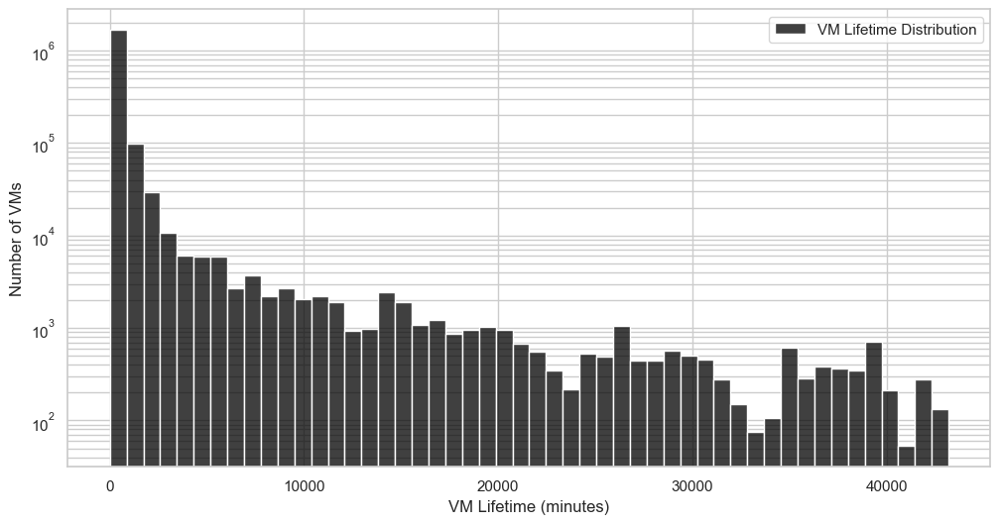

In [215]:
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

# Calculate VM lifetime in minutes
vm_lifetimes_minutes = (vm_deleted - vm_created) / 60  # convert seconds to minutes

# Prepare DataFrame for seaborn
plot_df = pd.DataFrame({'VM Lifetime (minutes)': vm_lifetimes_minutes})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.histplot(
    data=plot_df,
    x='VM Lifetime (minutes)',
    bins=50,
    color='black',
    kde=False,
    label='VM Lifetime Distribution'
)
plt.xlabel('VM Lifetime (minutes)')
plt.ylabel('Number of VMs')
#plt.title('Distribution of VM Lifetimes (log scale)')
plt.yscale('log')  # Log scale on y-axis
plt.grid(True, which='both', axis='y')
plt.legend()  # Show legend
plt.show()

## Aggregate of export per grids